## Importing all the Libraries

In [1]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

## Preprocessing

In [2]:
df = pd.read_csv("./dataset/DM1_game_dataset_cleaned.csv")

df.columns

Index(['Name', 'YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers',
       'MfgPlaytime', 'MfgAgeRec', 'NumAlternates', 'NumExpansions',
       'NumImplementations', 'IsReimplementation', 'Kickstarted', 'Rating',
       'HasFamily', 'Category', 'Rank', 'EngagementLevel'],
      dtype='object')

Excluded columns due to high zero values: ['NumAlternates', 'NumExpansions', 'NumImplementations']
Log-transforming columns: ['YearPublished', 'MinPlayers', 'MaxPlayers', 'MfgPlaytime']
Columns used for IQR-based row outlier detection: ['YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers', 'MfgPlaytime', 'MfgAgeRec', 'EngagementLevel']


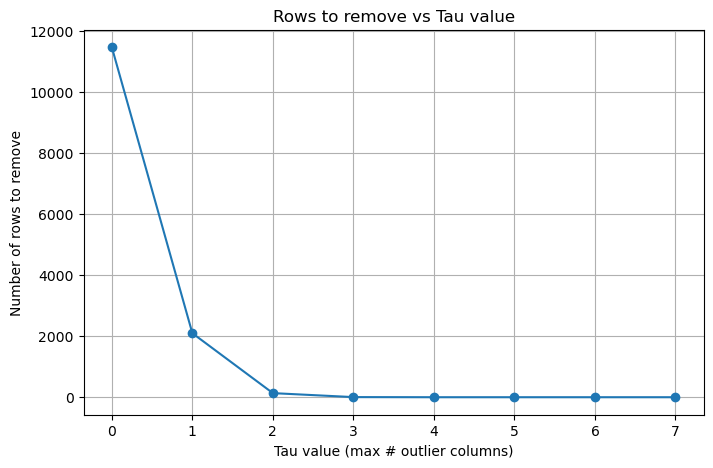

Chosen row-level outlier threshold (tau): 2
Number of rows to remove: 134
Shape after outlier removal: (21745, 7)


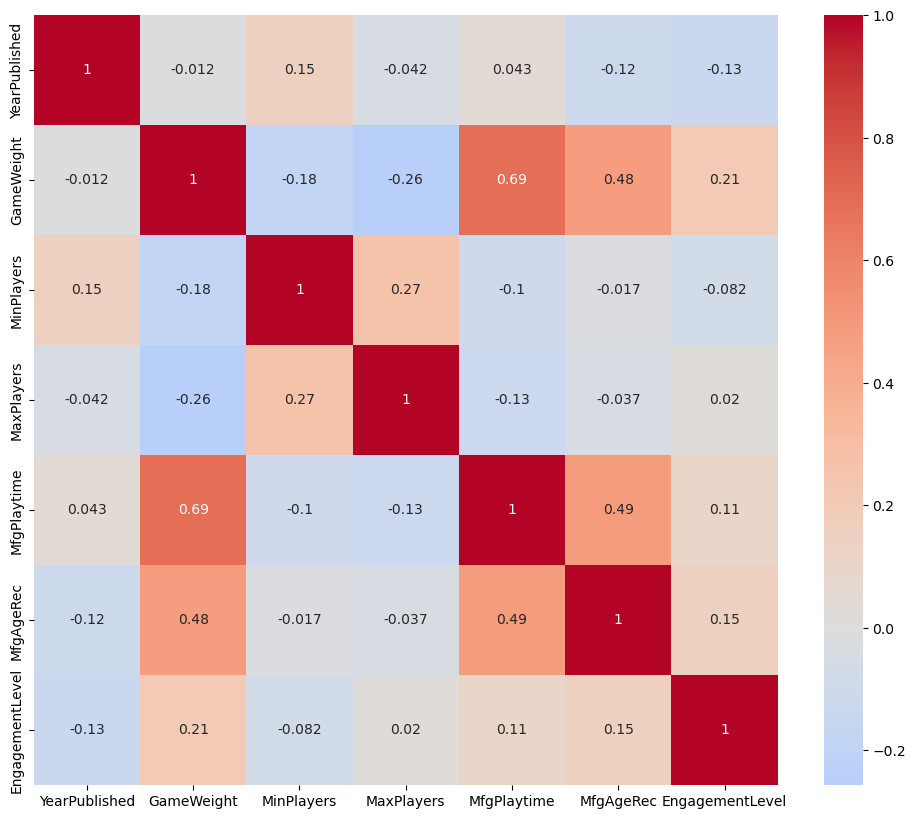

In [4]:
# 1. Select numeric columns
df_num = df.select_dtypes(include=["float64", "int64"])

# Remove binaries and Rank columns
numeric_cols = [col for col in df_num.columns 
                if df_num[col].nunique() > 2 and 'Rank' not in col]
df_num = df_num[numeric_cols].copy()

# 2. Fix YearPublished (recency)
if 'YearPublished' in df_num.columns:
    df_num['YearPublished'] = df_num['YearPublished'].max() - df_num['YearPublished']

# 3. Exclude columns with high zero values
zero_threshold = 0.5
cols_to_exclude = [col for col in df_num.columns 
                   if (df_num[col] == 0).mean() > zero_threshold]
df_num.drop(columns=cols_to_exclude, inplace=True)
print("Excluded columns due to high zero values:", cols_to_exclude)

# Log transform skewed columns except EngagementLevel
skewed_cols = df_num.skew().abs()
log_cols = skewed_cols[(skewed_cols >= 1.0) | (skewed_cols <= -1.0)].index.tolist()
log_cols = [c for c in log_cols if c != 'EngagementLevel']

df_num[log_cols] = df_num[log_cols].apply(np.log1p)
print("Log-transforming columns:", log_cols)

# 4. IQR-based row-level outlier detection on selected columns
cols_for_outliers = [
    'YearPublished', 'GameWeight', 'MinPlayers',
    'MaxPlayers', 'MfgPlaytime', 'MfgAgeRec', 'EngagementLevel'
]

# tieni solo quelle effettivamente presenti in df_num
cols_for_outliers = [c for c in cols_for_outliers if c in df_num.columns]
print("Columns used for IQR-based row outlier detection:", cols_for_outliers)

outlier_flags = pd.DataFrame(index=df_num.index)

for col in cols_for_outliers:
    q1 = df_num[col].quantile(0.25)
    q3 = df_num[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    outlier_flags[col] = (
        (df_num[col] < lower_bound) | (df_num[col] > upper_bound)
    ).astype(int)

# Ri = numero di outlier per riga
Ri = outlier_flags.sum(axis=1)

# Plot: numero di righe eliminate al variare di tau
tau_values = np.arange(0, len(cols_for_outliers) + 1)
rows_to_drop_counts = [(Ri > tau).sum() for tau in tau_values]

plt.figure(figsize=(8, 5))
plt.plot(tau_values, rows_to_drop_counts, marker='o')
plt.xlabel('Tau value (max # outlier columns)')
plt.ylabel('Number of rows to remove')
plt.title('Rows to remove vs Tau value')
plt.grid(True)
plt.show()

# QUI scegli tu il tau intero, in base al grafico
tau = 2  # ad esempio: max 2 colonne outlier consentite
print(f"Chosen row-level outlier threshold (tau): {tau}")

rows_to_drop = Ri[Ri > tau].index
print(f"Number of rows to remove: {len(rows_to_drop)}")

# Rimuovi le righe outlier
df_filtered = df_num.drop(index=rows_to_drop).reset_index(drop=True)
print("Shape after outlier removal:", df_filtered.shape)

# 5. Standardize AFTER outlier removal
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_filtered)
X_filtered = X_scaled   # alias se ti serve lo stesso nome in altri pezzi di codice

# 6. Correlation Matrix
plt.figure(figsize=(12, 10))
sns.heatmap(df_filtered.corr(), cmap='coolwarm', center=0, annot=True)
plt.show()



In [5]:
#removing the same outliers from the original dataframe
df_cleaned = df.drop(index=rows_to_drop).reset_index(drop=True)
print("Shape of original dataframe after outlier removal:", df_cleaned.shape)


Shape of original dataframe after outlier removal: (21745, 17)


## Ward Linkage Method

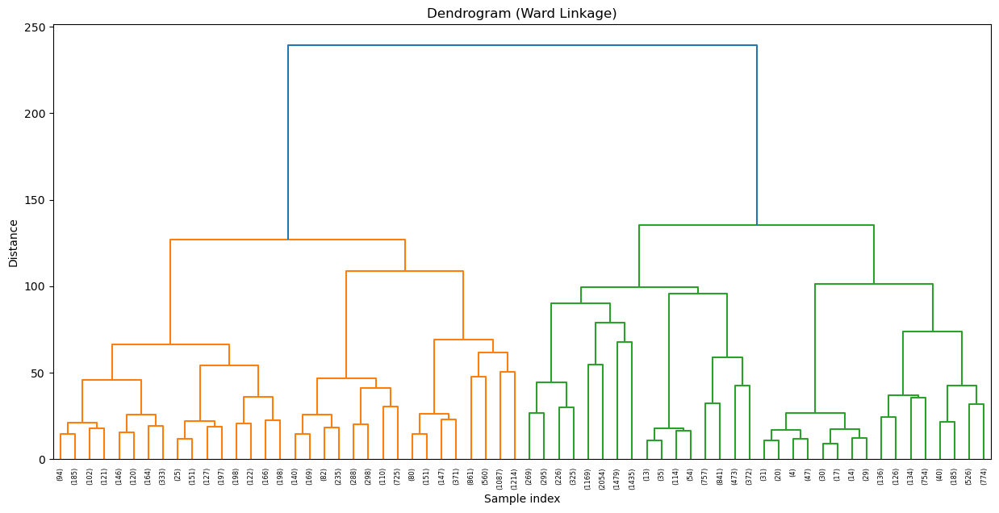

In [6]:
#creating the linkage matrix with Ward method
Z = linkage(X_filtered, method='ward')
# Plotting the dendrogram
plt.figure(figsize=(15, 7))
dendrogram(Z, truncate_mode='level', p=5)
plt.title('Dendrogram (Ward Linkage)')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()


Top 5 silhouette scores:

k = 2   ->  silhouette = 0.1799
k = 3   ->  silhouette = 0.1481
k = 4   ->  silhouette = 0.1396
k = 5   ->  silhouette = 0.1209
k = 6   ->  silhouette = 0.1178


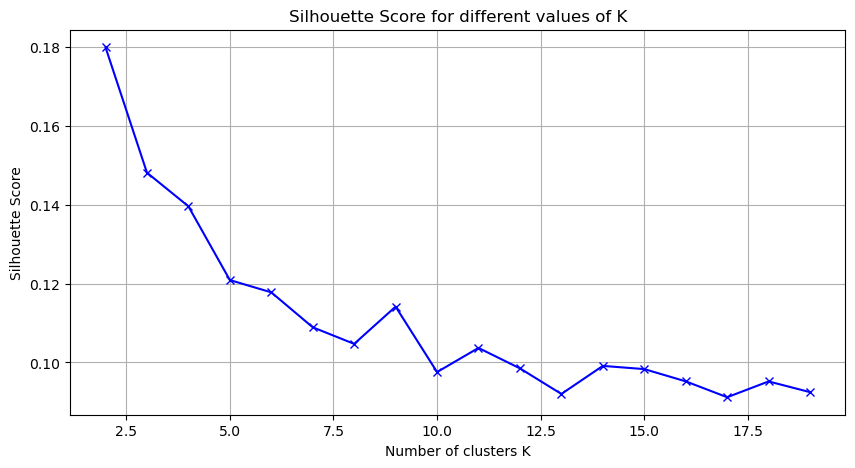

In [7]:
#analyzing the silhouette scores for different number of clusters
from sklearn.metrics import silhouette_score
silhouette_scores = []
K = range(2, 20)

for k in K:
    cluster_labels = fcluster(Z, k, criterion='maxclust')
    score = silhouette_score(X_filtered, cluster_labels)
    silhouette_scores.append((k, score))

# Ordina per silhouette decrescente
top5 = sorted(silhouette_scores, key=lambda x: x[1], reverse=True)[:5]

print("Top 5 silhouette scores:\n")
for k, score in top5:
    print(f"k = {k:<2d}  ->  silhouette = {score:.4f}")

# Plot completo
plt.figure(figsize=(10, 5))
plt.plot([k for k, s in silhouette_scores], 
         [s for k, s in silhouette_scores], 
         'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K')
plt.grid(True)
plt.show()



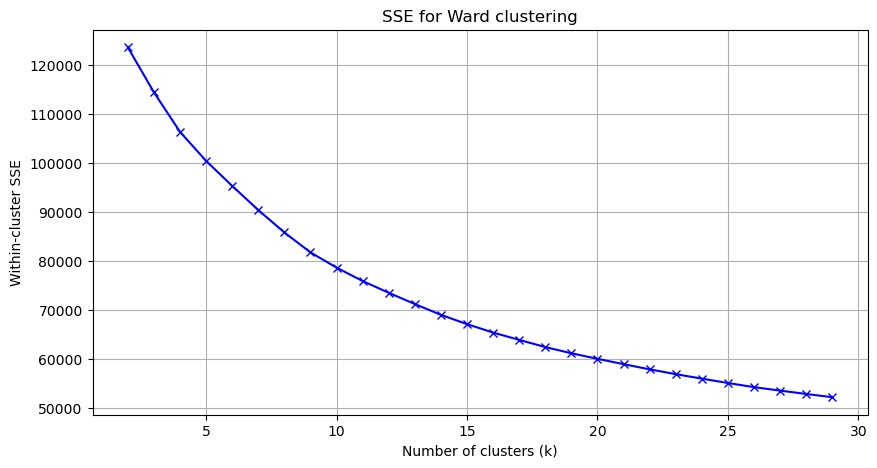

In [8]:
#SSE analysis for different number of clusters
import numpy as np
from scipy.cluster.hierarchy import fcluster

def compute_sse(X, labels):
    sse = 0
    for cluster_id in np.unique(labels):
        cluster_points = X[labels == cluster_id]
        centroid = cluster_points.mean(axis=0)
        sse += ((cluster_points - centroid)**2).sum()
    return sse

K = range(2, 30)
sse_values = []

for k in K:
    labels = fcluster(Z, k, criterion='maxclust')
    sse = compute_sse(X_filtered, labels)
    sse_values.append(sse)

plt.figure(figsize=(10, 5))
plt.plot(K, sse_values, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within-cluster SSE')
plt.title('SSE for Ward clustering')
plt.grid(True)
plt.show()


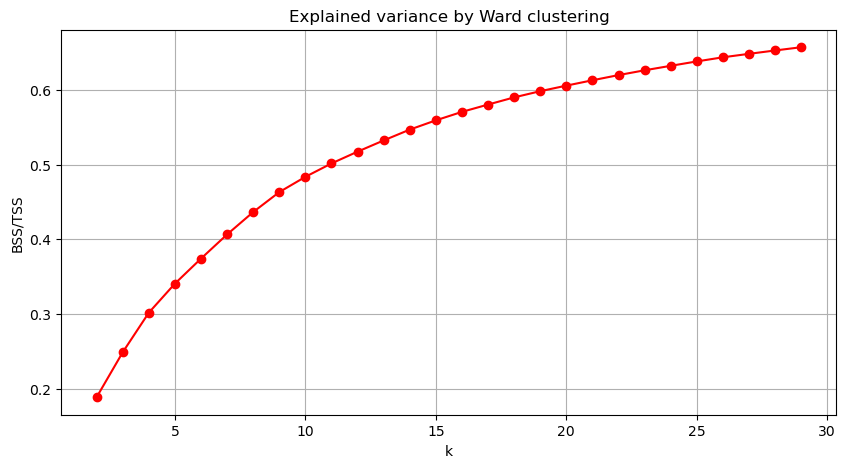

In [9]:
#analyzing BSS/TSS (BETWEEN/ TOTAL SUM OF SQUARES) for different number of clusters
global_mean = X_filtered.mean(axis=0)
TSS = ((X_filtered - global_mean)**2).sum()

bss_values = [TSS - sse for sse in sse_values]

plt.figure(figsize=(10,5))
plt.plot(K, [b/TSS for b in bss_values], 'ro-')
plt.xlabel("k")
plt.ylabel("BSS/TSS")
plt.title("Explained variance by Ward clustering")
plt.grid(True)
plt.show()


In [12]:
import pandas as pd
from scipy.cluster.hierarchy import fcluster

# Binary variables from df (original dataset)
binary_vars = ['IsReimplementation', 'Kickstarted', 'HasFamily']

# Numerical variables to summarize (those used in clustering)
num_vars = df_filtered.columns.tolist()

def summarize_clusters_full(Z, k, df_filtered, df_original):
    # 1. Compute cluster assignments
    labels = fcluster(Z, k, criterion='maxclust')

    # 2. Attach cluster labels to BOTH dataframes
    df_f = df_filtered.copy()
    df_f['cluster'] = labels

    df_o = df_original.copy()
    df_o['cluster'] = labels  # same labels!

    # 3. Numerical summary (from df_filtered)
    numerical_summary = df_f.groupby('cluster')[num_vars].mean()

    # 4. Binary summary (from original df)
    binary_summary = df_o.groupby('cluster')[binary_vars].mean() * 100

    # 5. Cluster sizes
    sizes = df_f['cluster'].value_counts().sort_index()

    return numerical_summary, binary_summary, sizes


# Generate results for k = 3, 4, 5
results = {}
for k in [3, 4, 5]:
    num_s, bin_s, sizes = summarize_clusters_full(Z, k, df_filtered, df_cleaned)
    results[k] = {
        "numerical": num_s,
        "binary": bin_s,
        "sizes": sizes
    }


# Print results
for k in results:
    print(f"\n===== RESULTS FOR k = {k} =====\n")
    print("Cluster sizes:\n", results[k]["sizes"], "\n")
    print("Numerical variables (means):\n", results[k]["numerical"], "\n")
    print("Binary variables (% incidence):\n", results[k]["binary"], "\n")



===== RESULTS FOR k = 3 =====

Cluster sizes:
 cluster
1    8967
2    9911
3    2867
Name: count, dtype: int64 

Numerical variables (means):
          YearPublished  GameWeight  MinPlayers  MaxPlayers  MfgPlaytime  \
cluster                                                                   
1             2.223251    2.660438    1.011466    1.537019     4.548127   
2             2.551050    1.569815    1.065755    1.678365     3.422975   
3             2.216311    1.509198    1.338116    2.227092     3.608069   

         MfgAgeRec  EngagementLevel  
cluster                              
1        11.852794         5.193867  
2         8.442236         4.599545  
3        11.174050         4.167217   

Binary variables (% incidence):
          IsReimplementation  Kickstarted  HasFamily
cluster                                            
1                 13.371250    20.910003  35.452214
2                 10.251236    10.564020  28.069821
3                 10.045344    14.300663  20.78

In [13]:
#creating clusters for the best k
best_k = 3  # assuming 2 is the best k from silhouette analysis
cluster_labels = fcluster(Z, best_k, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels
print(df_filtered['Cluster'].value_counts())

Cluster
2    9911
1    8967
3    2867
Name: count, dtype: int64


In [22]:
#analyzing clusters respect to categories distribution 
category_pct = (
    pd.crosstab(
        df_filtered['Cluster'],
        df_cleaned['Category'],   # Category presa dal df originale
        normalize='index'                           
    )*100
).round(2)
category_pct





Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
1,1.97,1.72,0.04,5.78,34.01,0.55,14.92,9.14,31.86
2,8.90,1.42,8.36,11.91,57.56,3.82,1.76,2.37,3.89
3,0.59,0.21,1.53,4.05,83.68,6.63,0.98,1.19,1.15


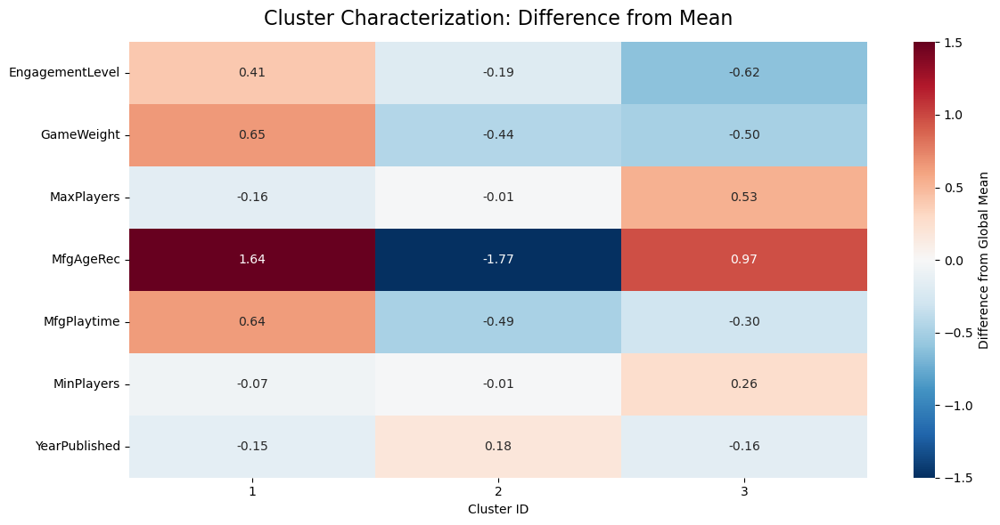

In [41]:
#heatmap with dist from average for each cluster
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Variabili numeriche da includere
num_vars = ['EngagementLevel', 'GameWeight', 'MaxPlayers',
            'MfgAgeRec', 'MfgPlaytime', 'MinPlayers', 'YearPublished']

# 2. Medie per cluster e media globale (come nel tuo codice originale)
cluster_means = df_filtered.groupby('Cluster')[num_vars].mean()
overall_mean  = df_filtered[num_vars].mean()

# 3. Differenza dalla media globale (NON normalizzata)
dist_from_overall = cluster_means - overall_mean

# 4. Trasponi per avere variabili sulle righe e cluster sulle colonne
dist_plot = dist_from_overall.T

# 5. Heatmap con estetica "figa"
plt.figure(figsize=(12, 6))
ax = sns.heatmap(
    dist_plot,
    annot=True,
    fmt=".2f",
    cmap='RdBu_r',          # diverging red–white–blue
    center=0,
    vmin=-1.5,              # adatta se vuoi più/meno contrasto
    vmax= 1.5,
    cbar_kws={'label': 'Difference from Global Mean'}
)

plt.title("Cluster Characterization: Difference from Mean", fontsize=16, pad=14)
plt.xlabel("Cluster ID")
plt.ylabel("")
plt.tight_layout()
plt.show()






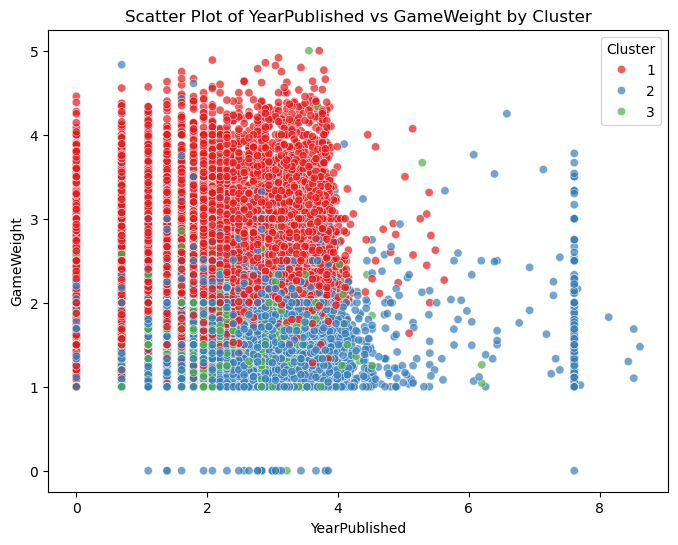

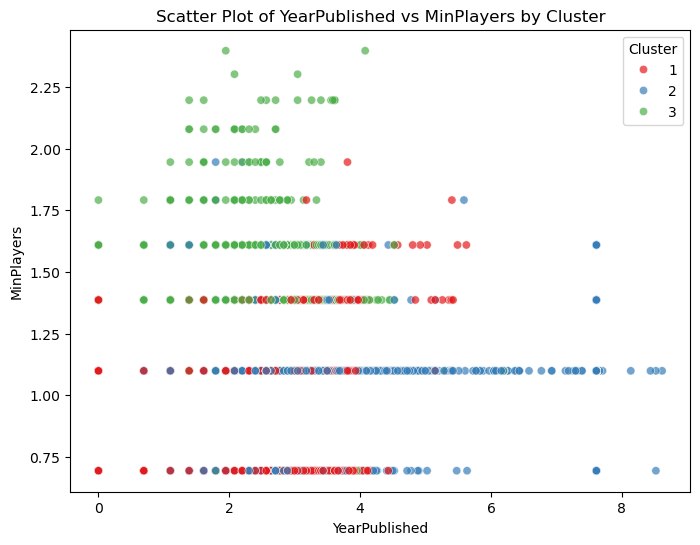

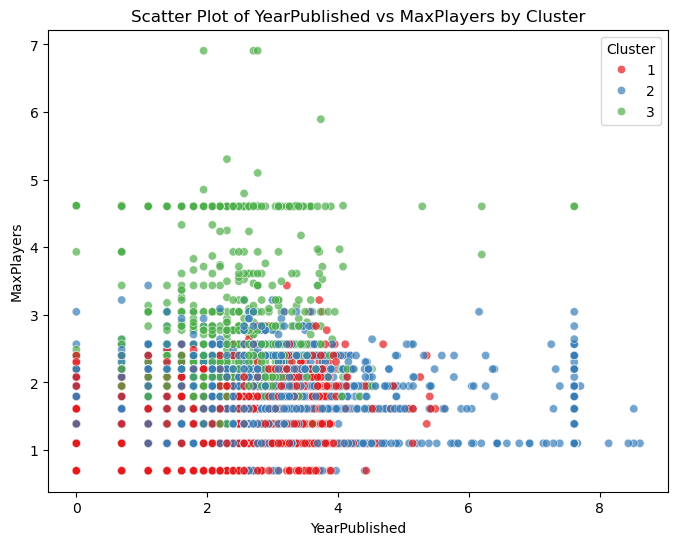

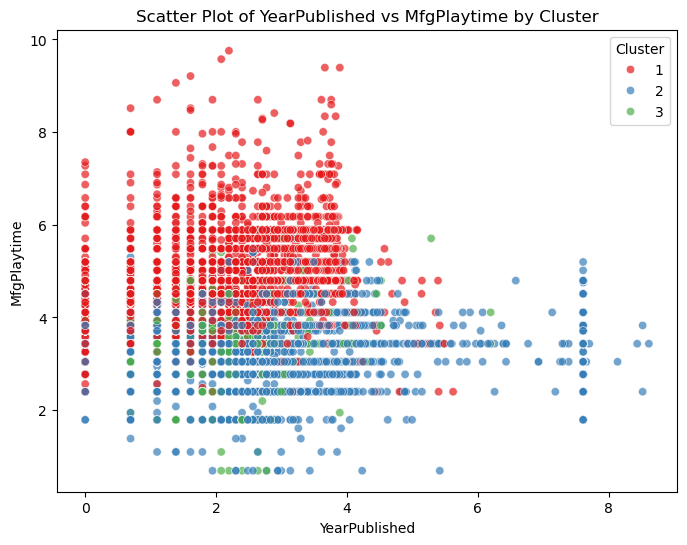

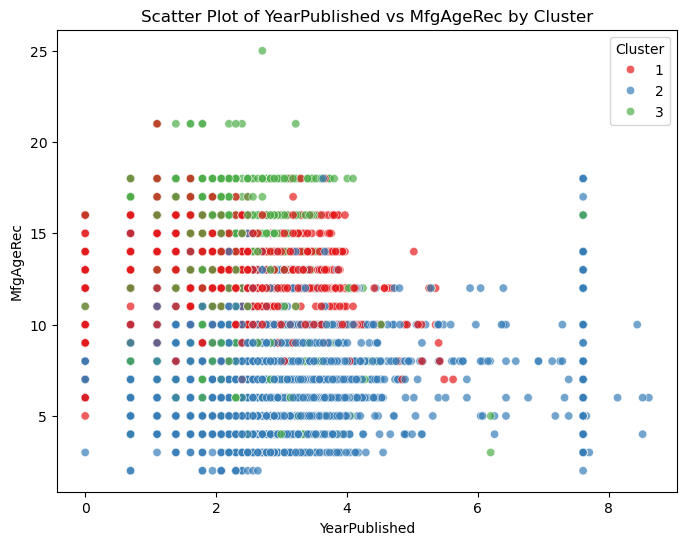

...

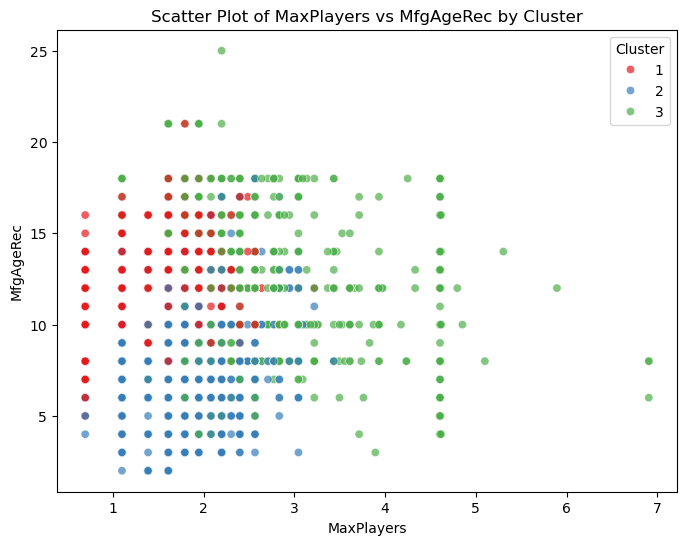

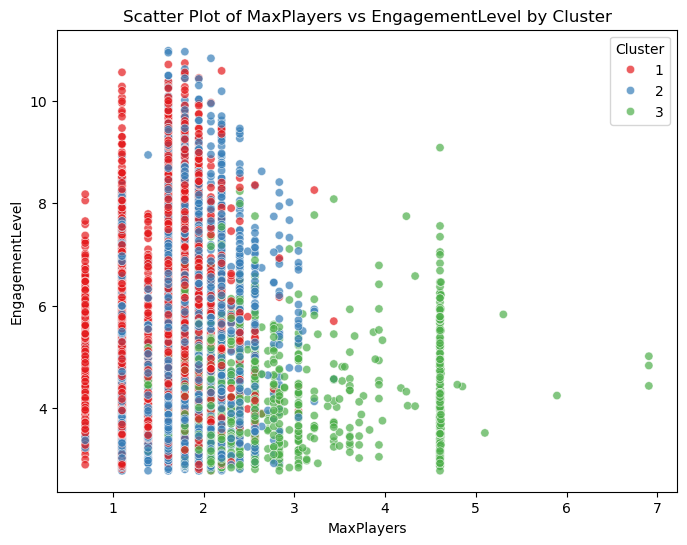

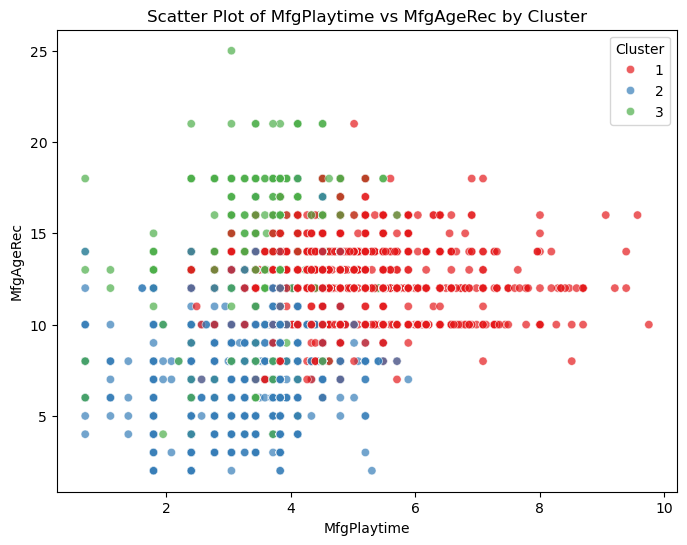

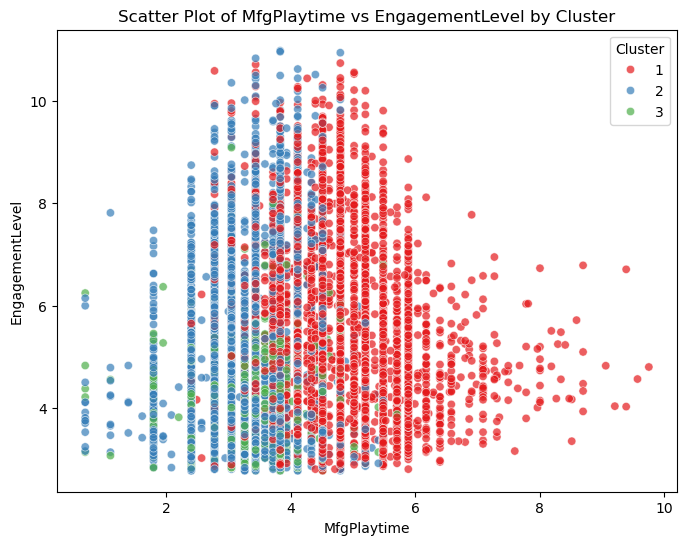

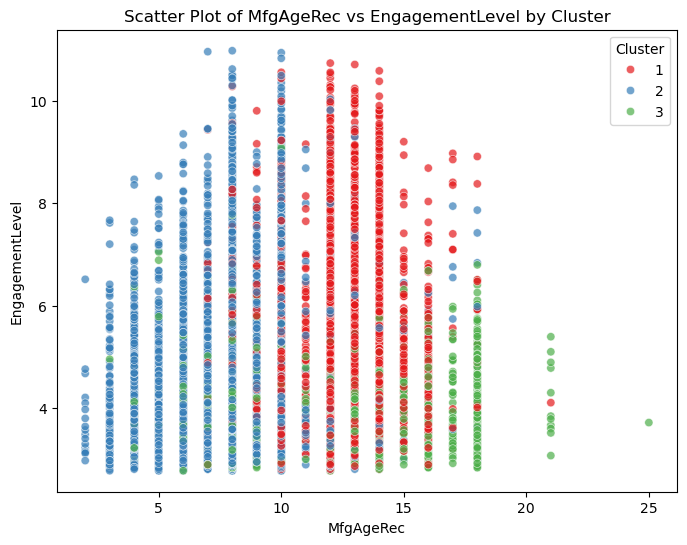

In [23]:
#generating scatter plots for each pair of features colored by cluster
import itertools
feature_pairs = list(itertools.combinations(df_filtered.columns[:-1], 2))  # exclude 'Cluster' column
for (feat_x, feat_y) in feature_pairs:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=df_filtered, 
        x=feat_x, 
        y=feat_y, 
        hue='Cluster', 
        palette='Set1', 
        alpha=0.7
    )
    plt.title(f'Scatter Plot of {feat_x} vs {feat_y} by Cluster')
    plt.legend(title='Cluster')
    plt.show()


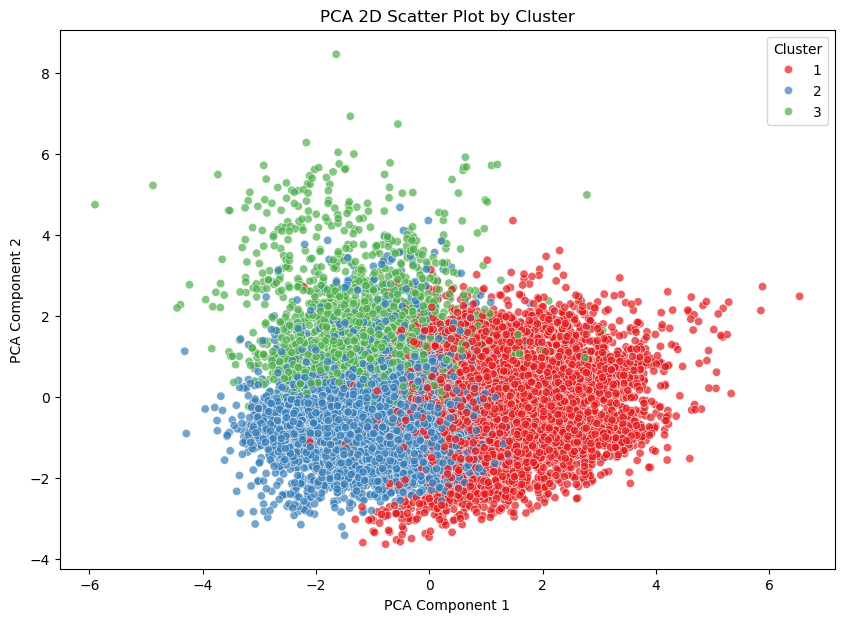

In [24]:
#PCA analysis for cluster visualization
from sklearn.decomposition import PCA
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_filtered)
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca_2d[:, 0], 
    y=X_pca_2d[:, 1], 
    hue=df_filtered['Cluster'], 
    palette='Set1', 
    alpha=0.7
)
plt.title('PCA 2D Scatter Plot by Cluster')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

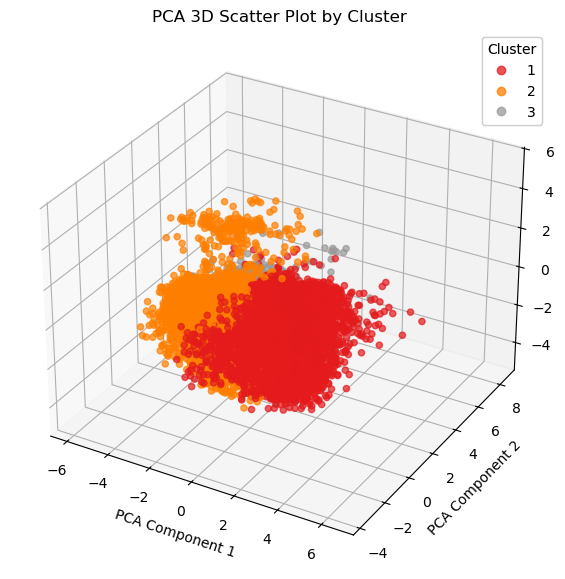

In [25]:
#pca with 3 components
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_filtered)
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    X_pca_3d[:, 0], 
    X_pca_3d[:, 1], 
    X_pca_3d[:, 2], 
    c=df_filtered['Cluster'], 
    cmap='Set1', 
    alpha=0.7
)
ax.set_title('PCA 3D Scatter Plot by Cluster')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
legend1 = ax.legend(*scatter.legend_elements(), title="Cluster")
ax.add_artist(legend1)
plt.show()  

## Complete Linkage Method

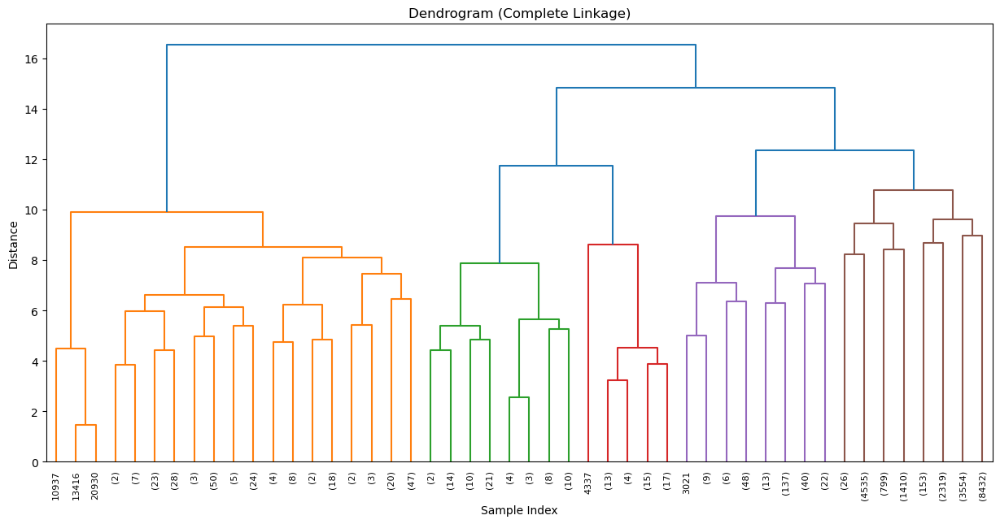

In [16]:
Z_complete = linkage(X_filtered, method='complete')

# === Dendrogram ===
plt.figure(figsize=(15, 7))
dendrogram(
    Z_complete,
    truncate_mode='level',
    p=5
)
plt.title('Dendrogram (Complete Linkage)')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()


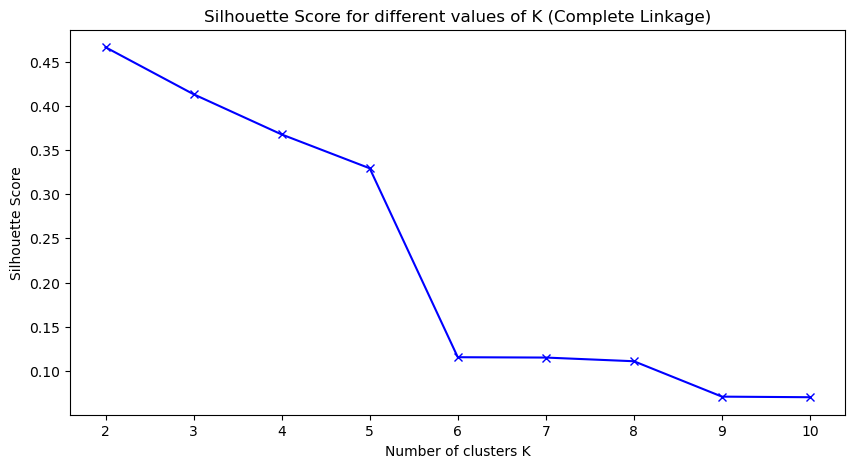

In [17]:
#silhouette analysis for complete linkage, plotting the scores
silhouette_scores_complete = []
K = range(2, 11)
for k in K:
    cluster_labels_complete = fcluster(Z_complete, k, criterion='maxclust')
    score_complete = silhouette_score(X_filtered, cluster_labels_complete)
    silhouette_scores_complete.append(score_complete)
plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores_complete, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Complete Linkage)')
plt.show()

In [27]:
#assigning clusters for complete linkage 
best_k_complete = 5  # assuming 5 is the best k from silhouette analysis
cluster_labels_complete = fcluster(Z_complete, best_k_complete, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels_complete
print(df_filtered['Cluster'].value_counts())    

Cluster
5    21228
4      276
1      249
2       72
3       50
Name: count, dtype: int64


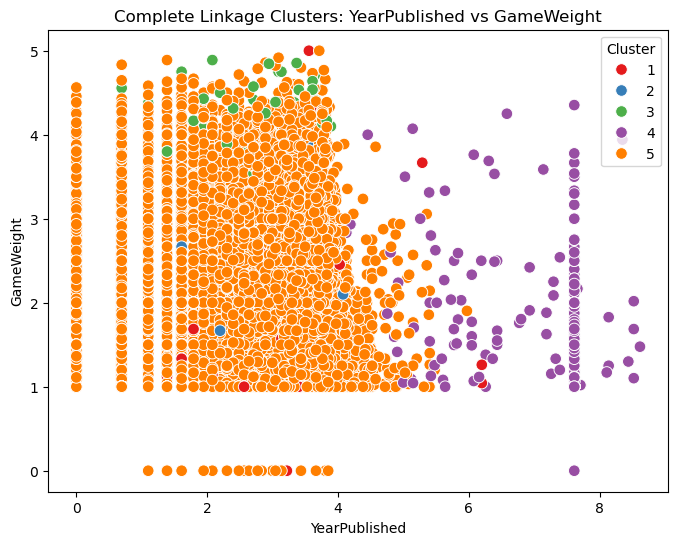

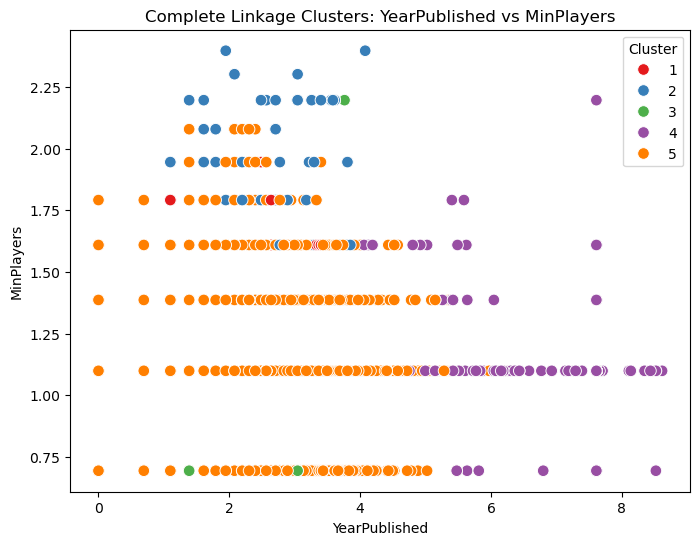

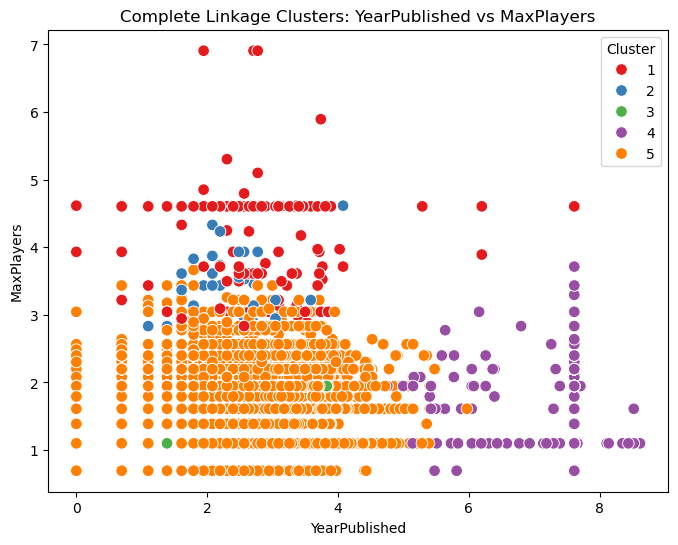

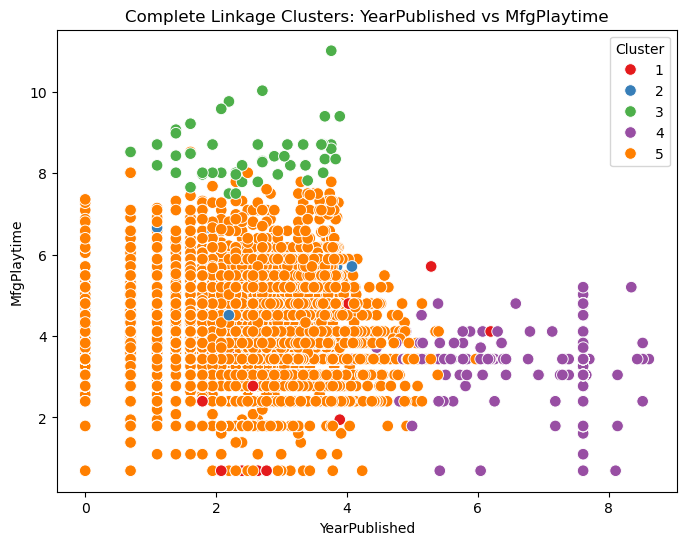

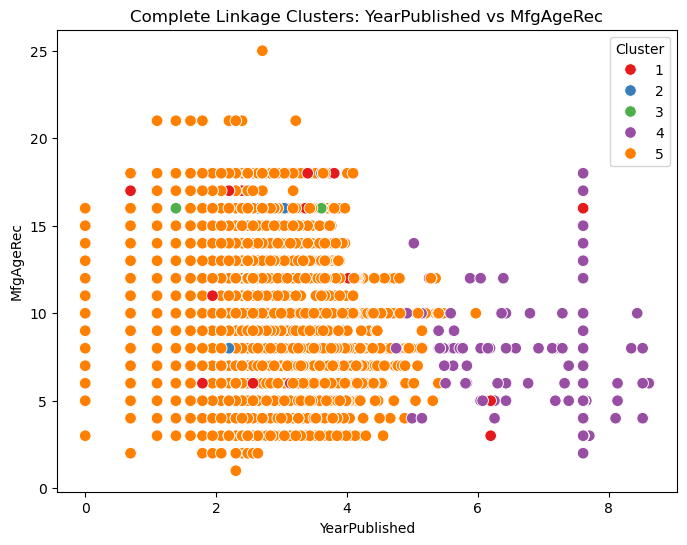

...

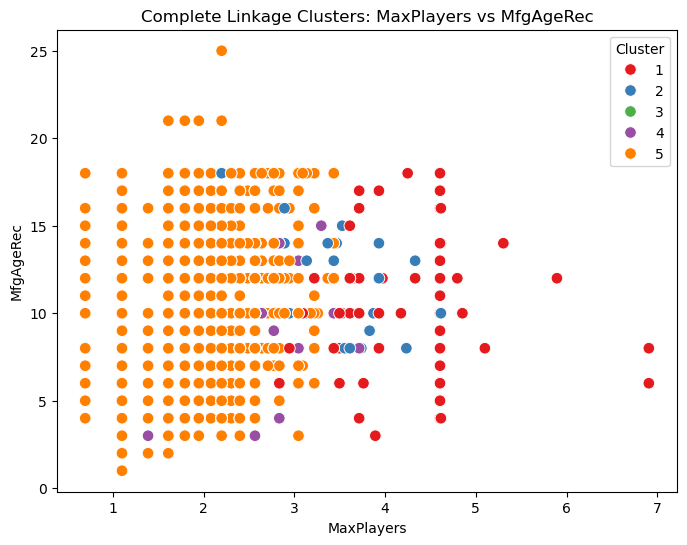

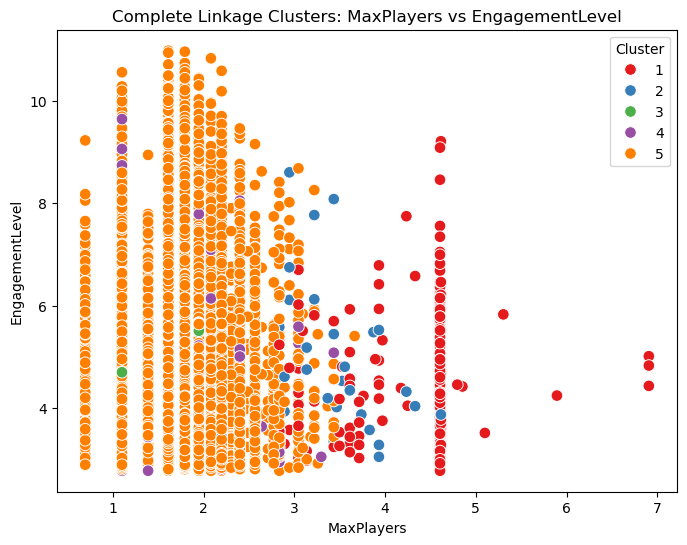

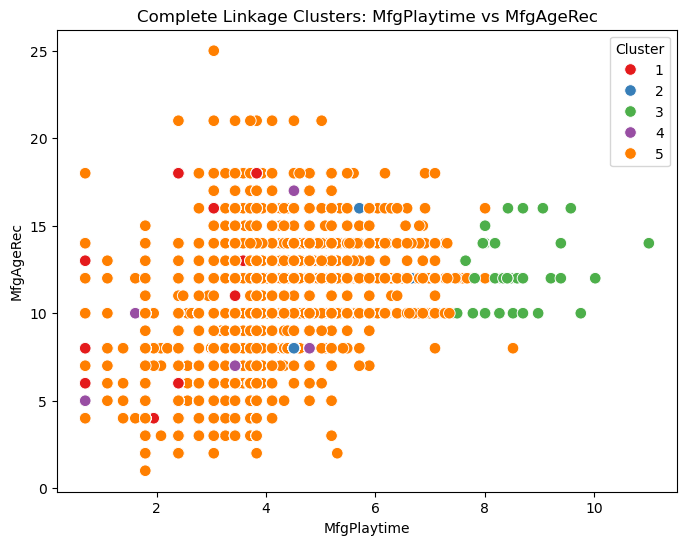

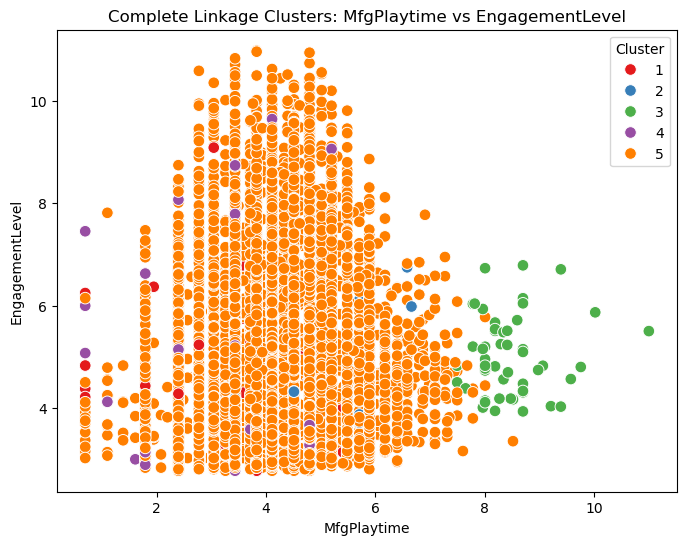

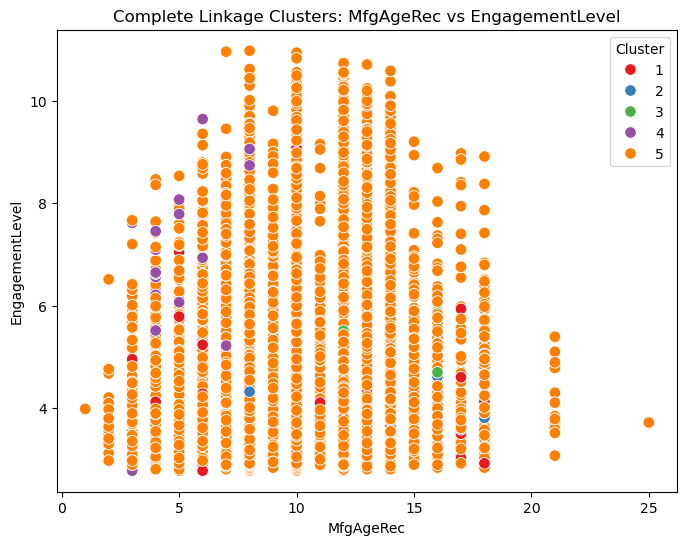

In [22]:
#plotting scatter plots for complete linkage clusters for each pair of features in the filtered dataset
feature_cols = [col for col in df_filtered.columns if col != "Cluster"]
for i in range(len(feature_cols)):
    for j in range(i + 1, len(feature_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(
            data=df_filtered,
            x=feature_cols[i],
            y=feature_cols[j],
            hue=df_filtered["Cluster"],
            palette="Set1",
            s=70
        )
        plt.title(f"Complete Linkage Clusters: {feature_cols[i]} vs {feature_cols[j]}")
        plt.legend(title="Cluster")
        plt.show()

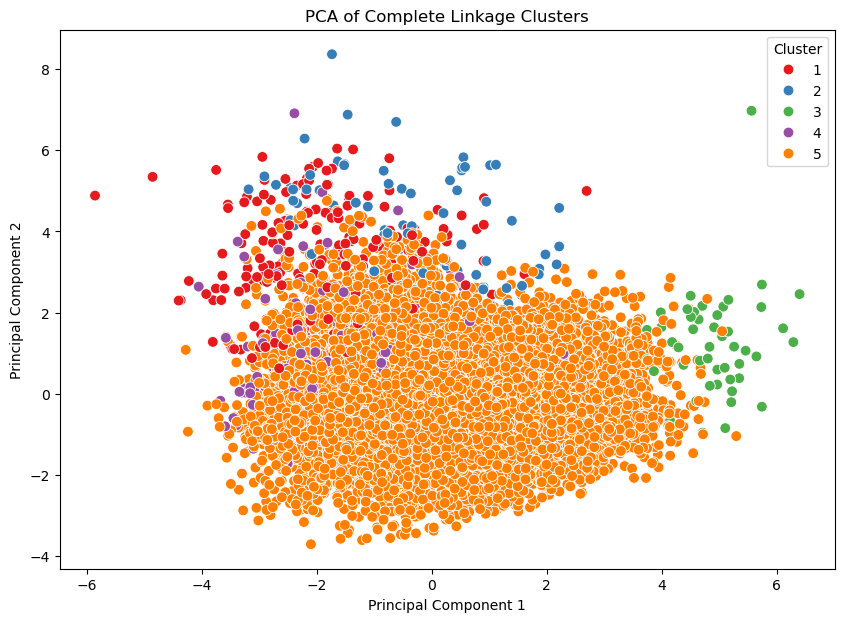

In [25]:
#pca analysis for complete linkage clusters
#importing PCA from sklearn
from sklearn.decomposition import PCA
pca_2d_complete = PCA(n_components=2)
X_pca_2d_complete = pca_2d_complete.fit_transform(X_filtered)
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca_2d_complete[:, 0],
    y=X_pca_2d_complete[:, 1],
    hue=cluster_labels_complete,
    palette="Set1",
    s=60
)
plt.title("PCA of Complete Linkage Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.show()


## Single Linkage

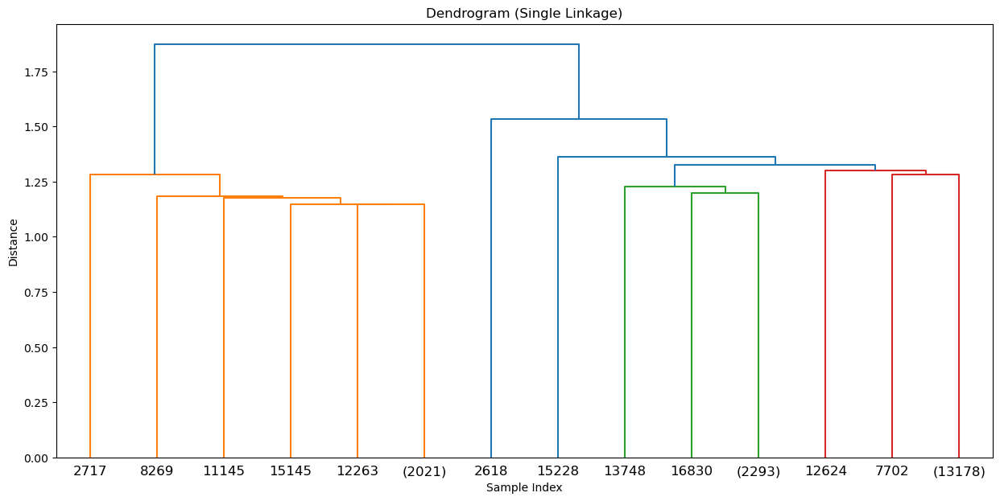

In [19]:
Z_single = linkage(X_filtered, method='single')

# === Plot Dendrogram ===
plt.figure(figsize=(15, 7))
dendrogram(
    Z_single,
    truncate_mode='level',
    p=5
)
plt.title('Dendrogram (Single Linkage)')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

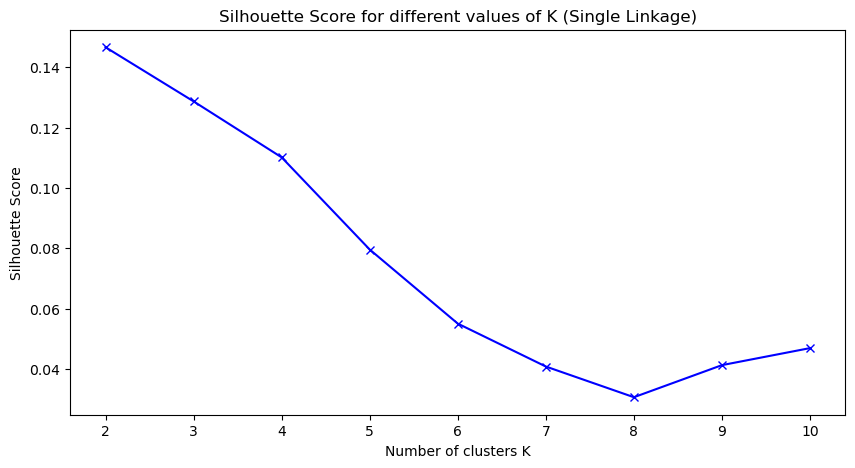

In [20]:
#silhouette analysis for complete linkage
silhouette_scores_complete = []
K = range(2, 11)
for k in K:
    cluster_labels_complete = fcluster(Z_complete, k, criterion='maxclust')
    score_complete = silhouette_score(X_filtered, cluster_labels_complete)
    silhouette_scores_complete.append(score_complete)
plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores_complete, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Single Linkage)')
plt.show()

In [21]:
#assigning clusters for single linkage for k = 2
best_k_single = 2  # assuming 2 is the best k from silhouette analysis
cluster_labels_single = fcluster(Z_single, best_k_single, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels_single
print(df_filtered['Cluster'].value_counts())

Cluster
2    15477
1     2026
Name: count, dtype: int64


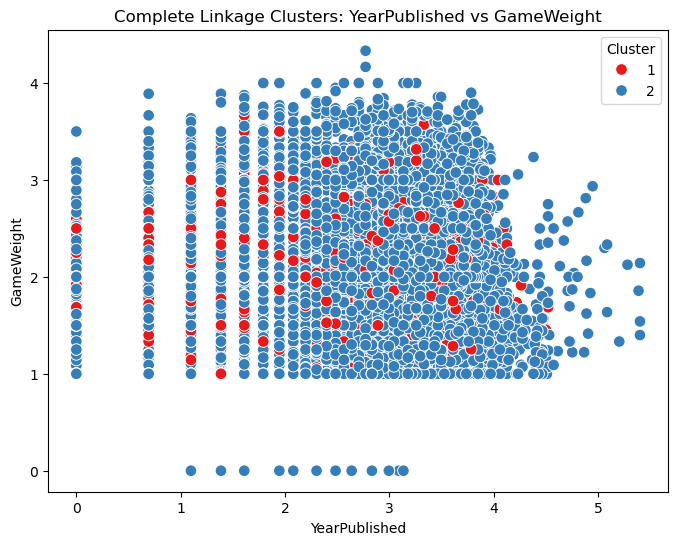

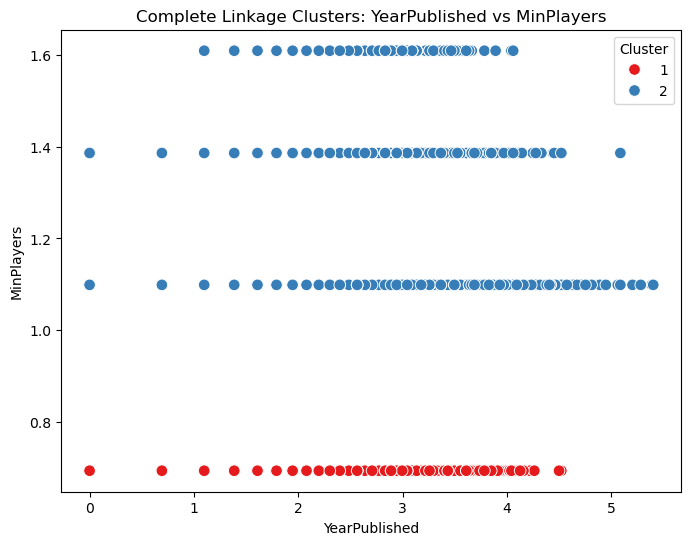

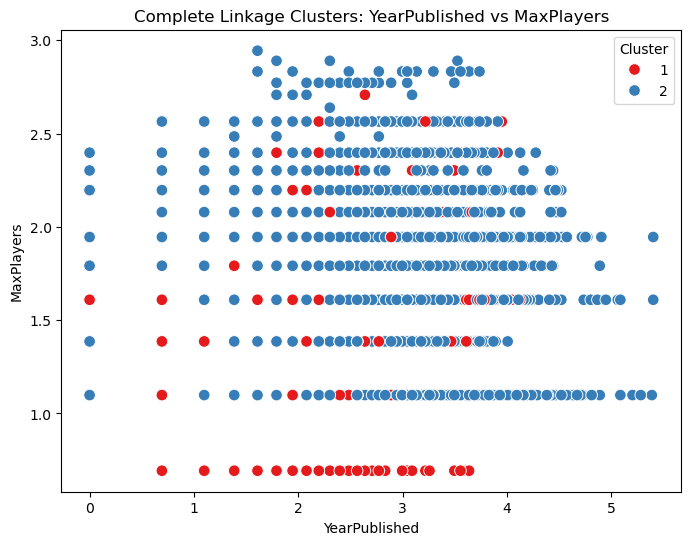

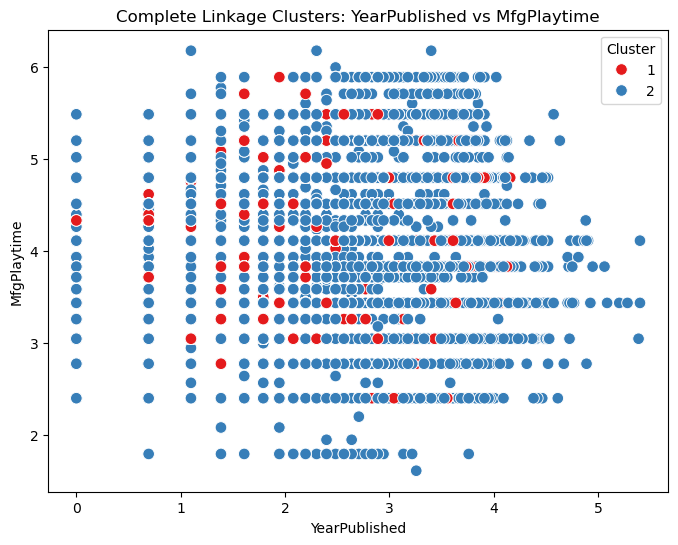

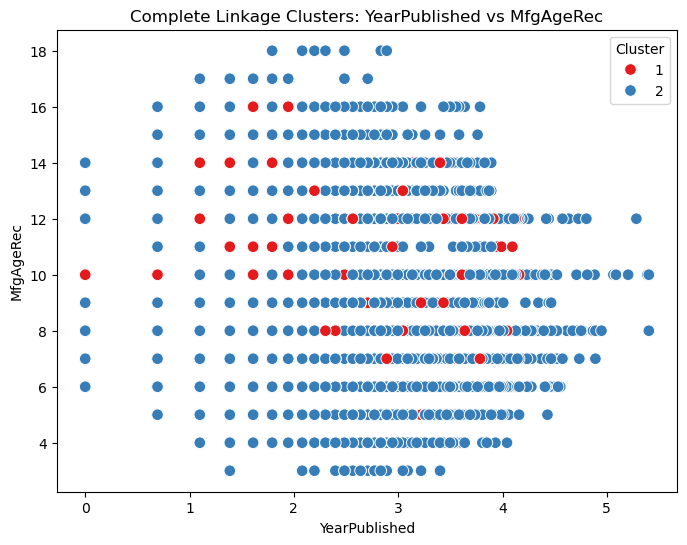

...

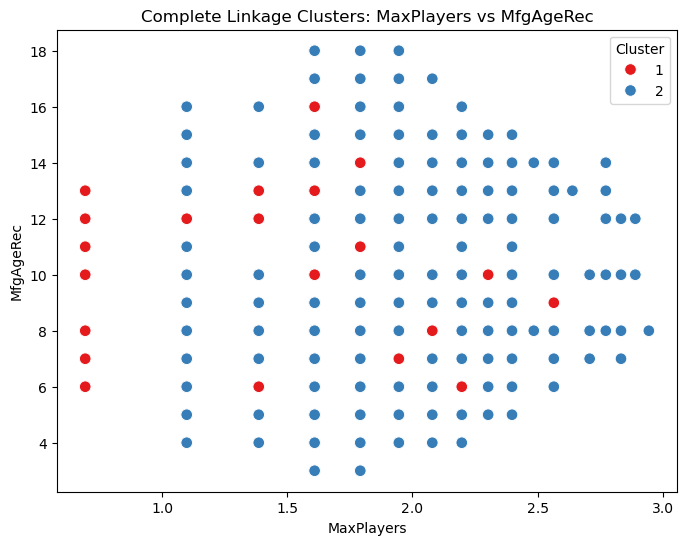

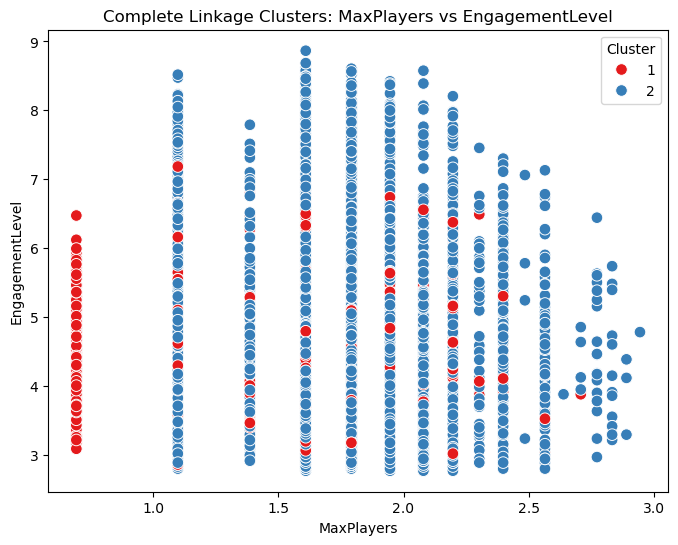

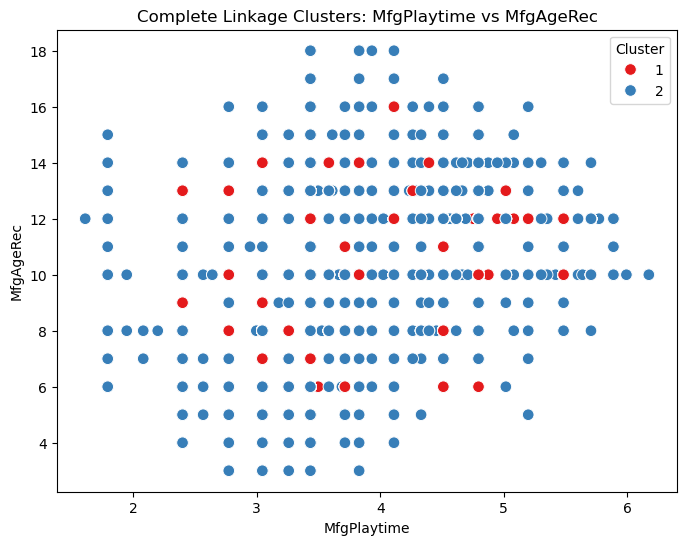

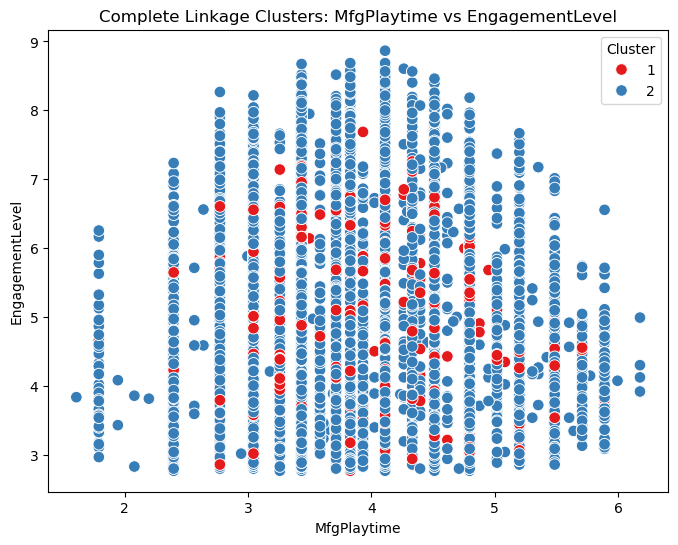

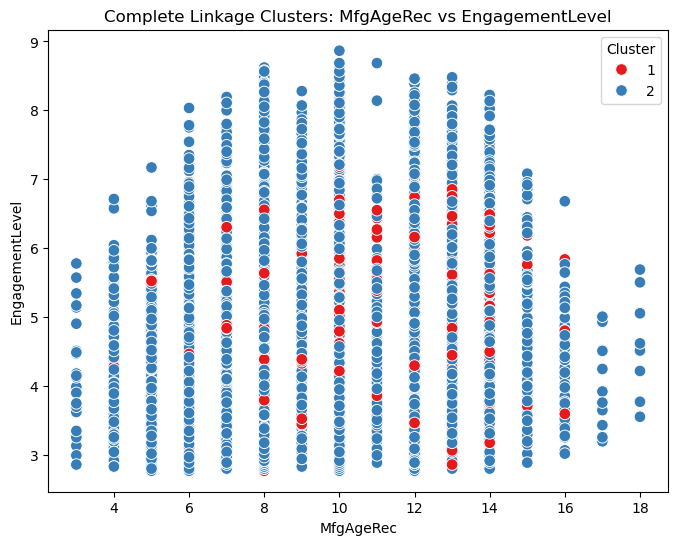

In [22]:
#plotting scatter plots for complete linkage clusters for each pair of features in the filtered dataset
feature_cols = [col for col in df_filtered.columns if col != "Cluster"]
for i in range(len(feature_cols)):
    for j in range(i + 1, len(feature_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(
            data=df_filtered,
            x=feature_cols[i],
            y=feature_cols[j],
            hue=df_filtered["Cluster"],
            palette="Set1",
            s=70
        )
        plt.title(f"Complete Linkage Clusters: {feature_cols[i]} vs {feature_cols[j]}")
        plt.legend(title="Cluster")
        plt.show()

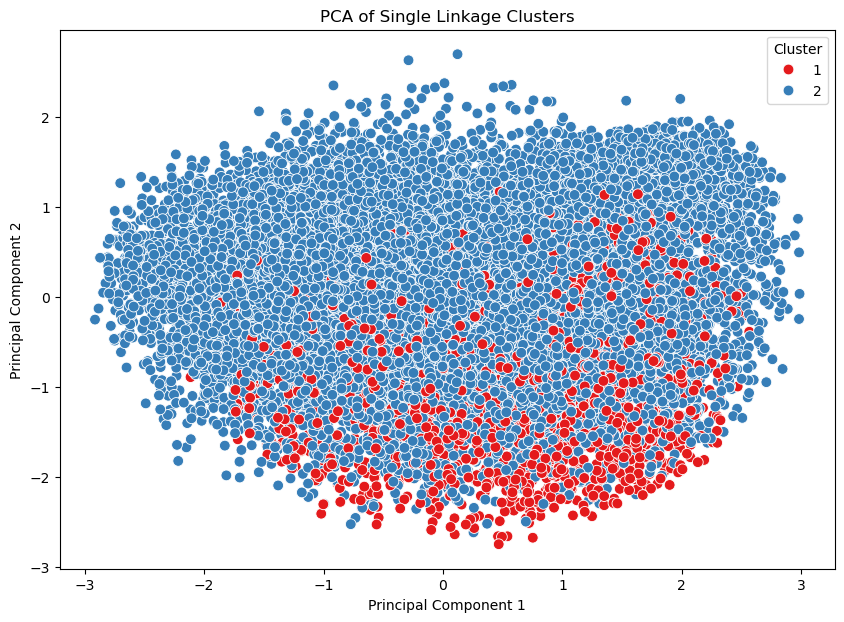

In [23]:
#pca analysis for cluster visualization in 2d
pca_2d_single = PCA(n_components=2)
X_pca_2d_single = pca_2d_single.fit_transform(X_filtered)
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca_2d_single[:, 0],
    y=X_pca_2d_single[:, 1],
    hue=cluster_labels_single,
    palette="Set1",
    s=60
) 
plt.title("PCA of Single Linkage Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.show()

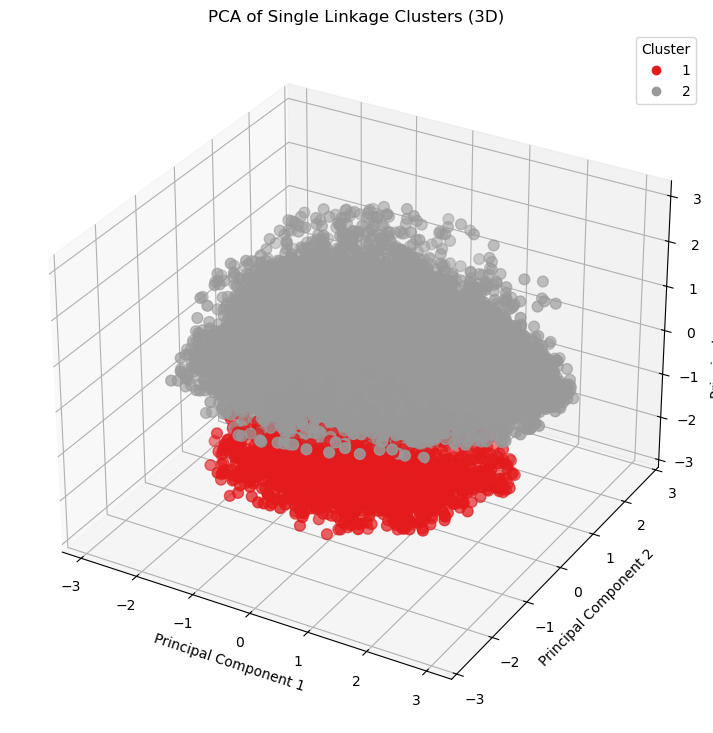

In [24]:
#pca analysis for cluster visualization in 3d
pca_3d_single = PCA(n_components=3)
X_pca_3d_single = pca_3d_single.fit_transform(X_filtered)
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    X_pca_3d_single[:, 0],
    X_pca_3d_single[:, 1],
    X_pca_3d_single[:, 2],
    c=cluster_labels_single,
    cmap="Set1",
    s=60
)
ax.set_title("PCA of Single Linkage Clusters (3D)")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")
plt.legend(*scatter.legend_elements(), title="Cluster")
plt.show()    

## Average Linkage

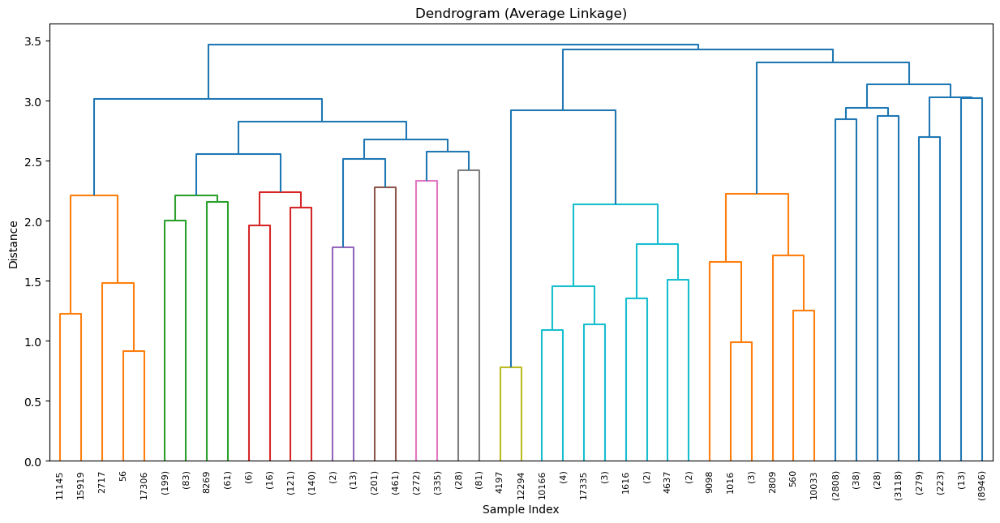

In [25]:
# === Average Linkage clustering ===
Z_average = linkage(X_filtered, method='average')

# === Plot the dendrogram ===
plt.figure(figsize=(15, 7))
dendrogram(
    Z_average,
    truncate_mode='level',
    p=5
)
plt.title("Dendrogram (Average Linkage)")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

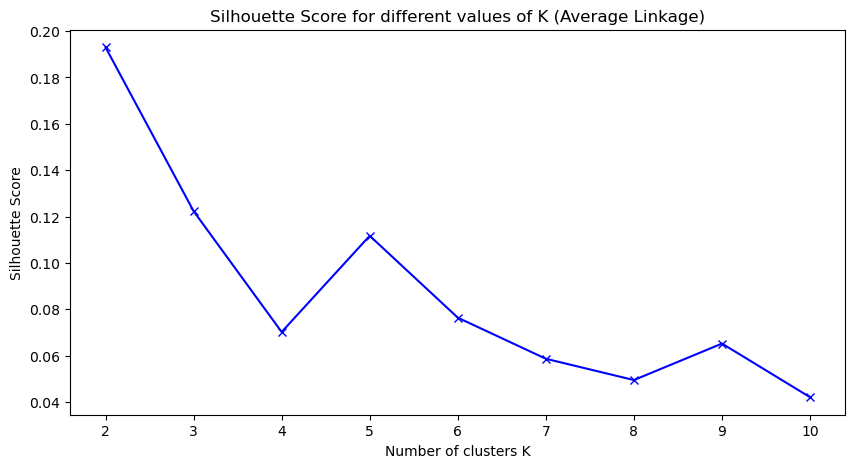

In [26]:
#silhouette analysis for average linkage
silhouette_scores_average = []
K = range(2, 11)
for k in K:
    cluster_labels_average = fcluster(Z_average, k, criterion='maxclust')
    score_average = silhouette_score(X_filtered, cluster_labels_average)
    silhouette_scores_average.append(score_average)
plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores_average, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Average Linkage)')
plt.show() 


In [27]:
#assigning clusters for average linkage with k = 3
best_k_average = 2  # assuming 3 is the best k from silhouette analysis
cluster_labels_average = fcluster(Z_average, best_k_average, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels_average
print(df_filtered['Cluster'].value_counts())



Cluster
2    15478
1     2025
Name: count, dtype: int64


## Experiment with Jaccard distance for Binary Variables

In [28]:
import numpy as np
from scipy.spatial.distance import pdist, euclidean, jaccard
from scipy.cluster.hierarchy import linkage, dendrogram

# ----------------------------
# 1. Define your variable sets
# ----------------------------
cont_cols = ['YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers',
             'MfgPlaytime', 'MfgAgeRec', 'EngagementLevel']

bin_cols  = ['HasFamily', 'IsReimplementation', 'Kickstarted']

# Create matrix in correct order
X_mixed = df[cont_cols + bin_cols].copy()

# Ensure binary columns are integers 0/1
for c in bin_cols:
    X_mixed[c] = X_mixed[c].astype(int)

# Number of continuous variables
index = len(cont_cols)   # = 7

# -----------------------------------------
# 2. Mixed distance function (EUCLIDEAN + JACCARD)
# -----------------------------------------
def mixed(u, v):
    # Continuous part: Euclidean
    d_con = euclidean(u[:index], v[:index])

    # Binary part: Jaccard
    d_cat = jaccard(u[index:], v[index:])

    # Weights proportional to number of features
    w_con = index / len(u)
    w_cat = (len(u) - index) / len(u)

    # Weighted combination
    return w_con * d_con + w_cat * d_cat

# -----------------------------------------
# 3. Compute pairwise distance matrix
# -----------------------------------------
D = pdist(X_mixed.values, metric=mixed)

# -----------------------------------------
# 4. Apply hierarchical clustering
# -----------------------------------------
Z = linkage(D, method='complete')  # you can try 'average', 'single', etc.

# Optional dendrogram
dendrogram(Z, labels=df.index, leaf_rotation=90)
plt.title("Hierarchical Clustering with Mixed Distance (Euclidean + Jaccard)")
plt.show()


KeyboardInterrupt: 